In [1]:
!pip install imutils

In [2]:
import keras
import cv2
import numpy as np
from tensorflow.keras.utils import img_to_array
import imutils
import os
from tensorflow.keras.models import load_model

In [5]:
# Example for alphabet matching
alphabet = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z']
my_model = load_model("C:/Users/91868/Downloads/my_model")
my_model.load_weights("C:/Users/91868/Downloads/weights.h5")

In [6]:
def classify(image):
    image = cv2.resize(image, (28, 28))  # Resize the image to the input size of the model
    image = image.astype("float") / 255.0  # Normalize the image to [0, 1] range
    image = img_to_array(image)  # Convert image to array
    image = np.expand_dims(image, axis=0)  # Expand dimensions to match the model input
    proba = my_model.predict(image)  # Get prediction from the model
    idx = np.argmax(proba)  # Get the index of the highest probability class
    return alphabet[idx]  # Return the predicted label (e.g., 'A', 'B', 'C', etc.)

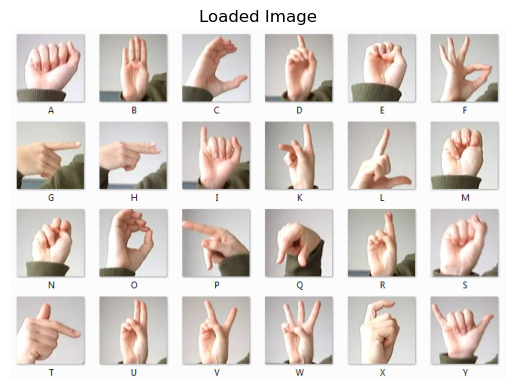

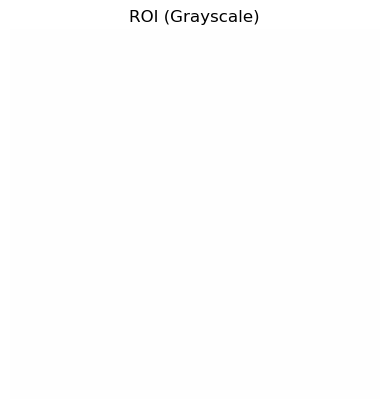

1/1 [==============================] - 0s 490ms/step


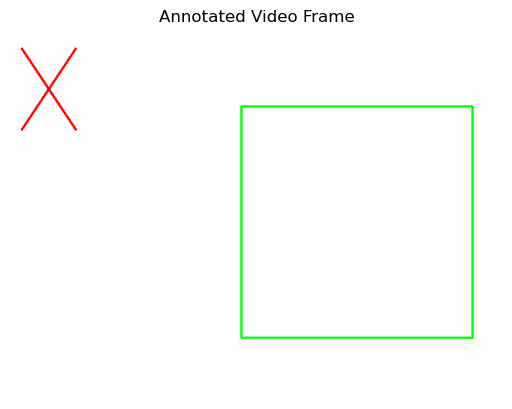

Press 'q' to quit or Enter to continue: 


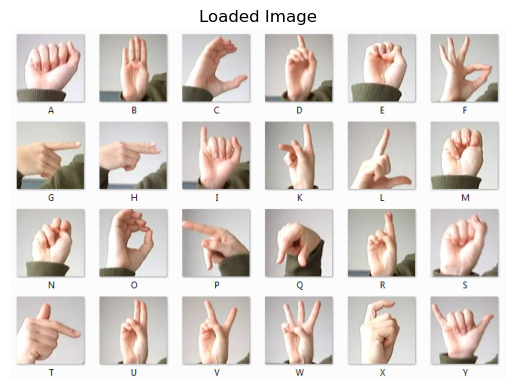

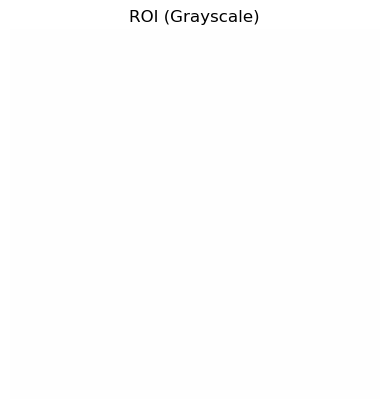

1/1 [==============================] - 0s 23ms/step


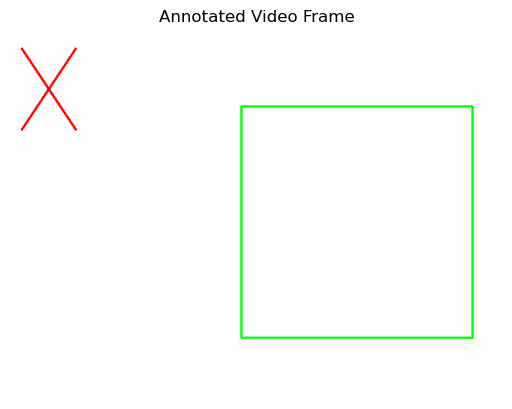

Press 'q' to quit or Enter to continue: 


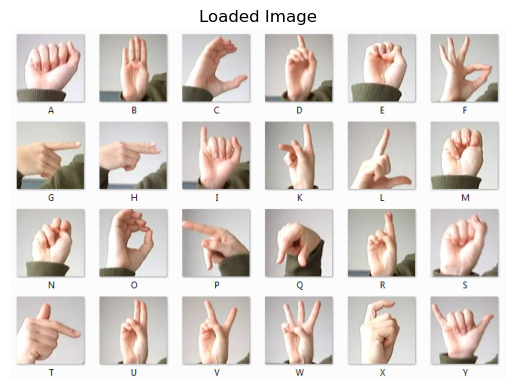

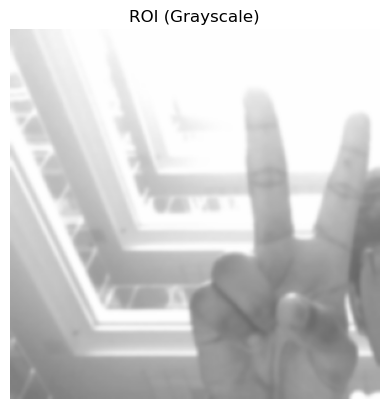

1/1 [==============================] - 0s 28ms/step


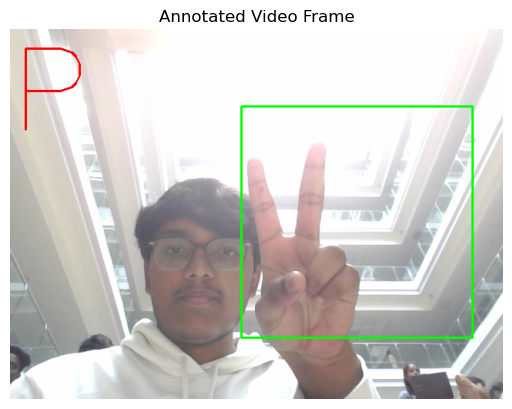

Press 'q' to quit or Enter to continue: 


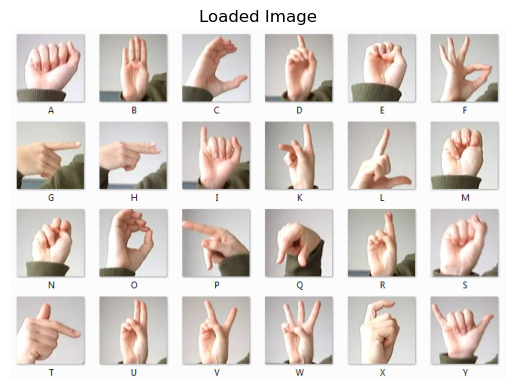

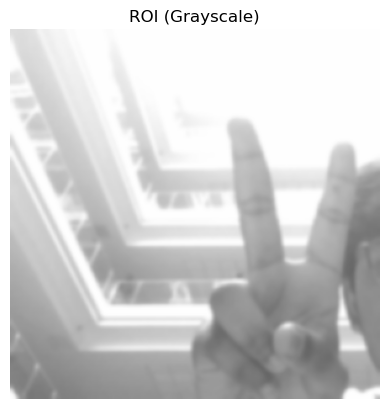

1/1 [==============================] - 0s 23ms/step


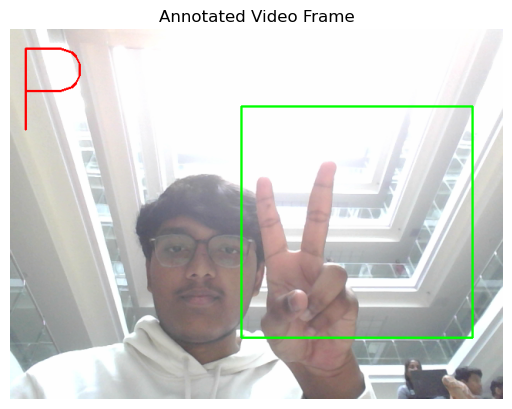

Press 'q' to quit or Enter to continue: 


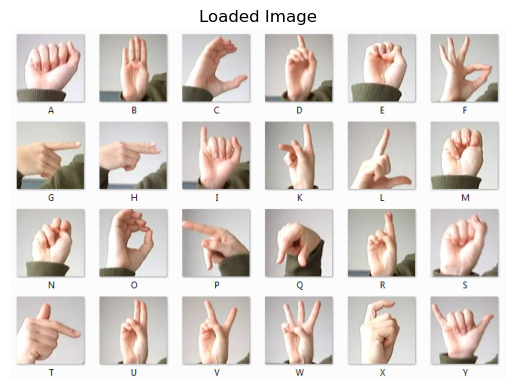

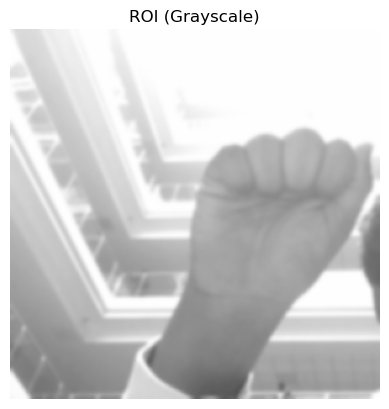

1/1 [==============================] - 0s 48ms/step


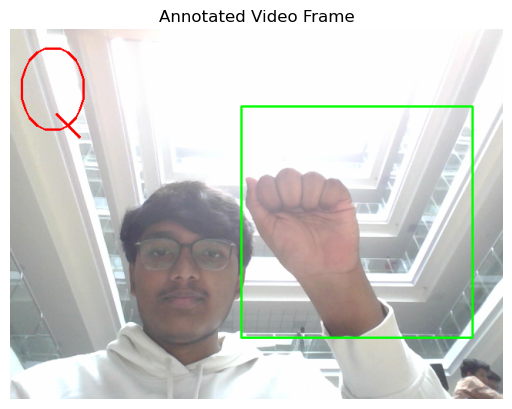

Press 'q' to quit or Enter to continue: 


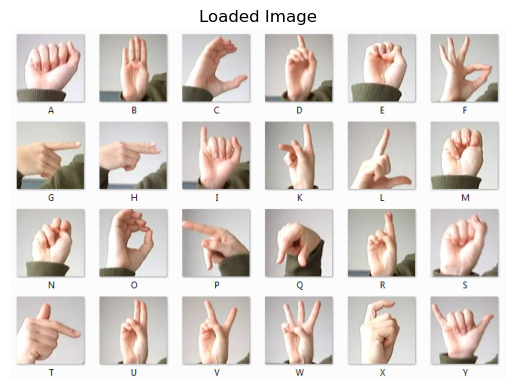

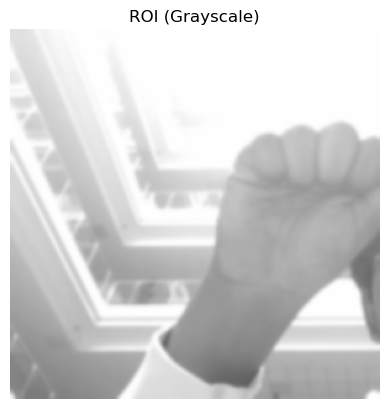

1/1 [==============================] - 0s 29ms/step


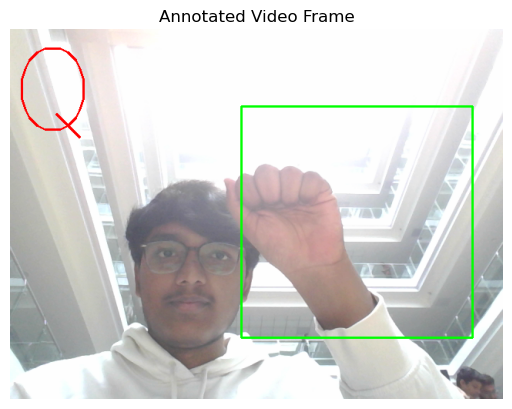

Press 'q' to quit or Enter to continue: 


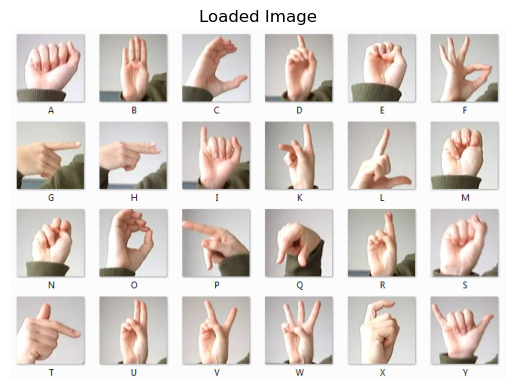

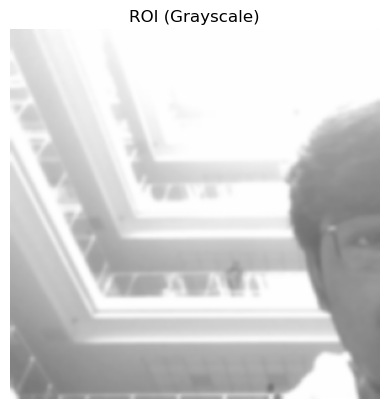

1/1 [==============================] - 0s 25ms/step


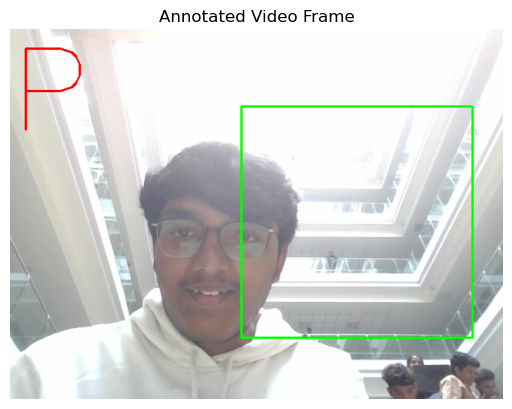

Press 'q' to quit or Enter to continue: 


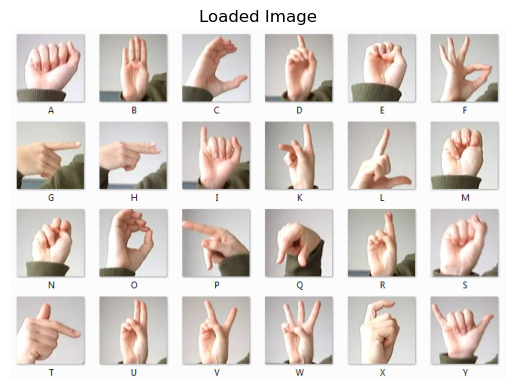

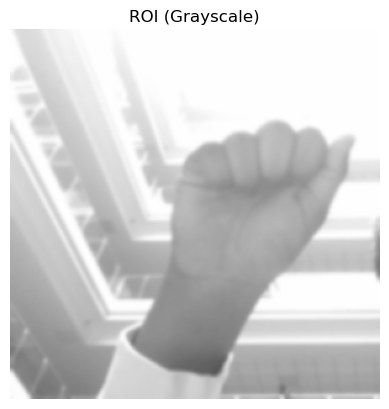

1/1 [==============================] - 0s 23ms/step


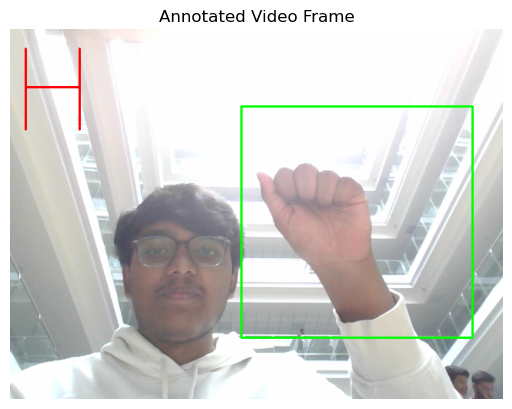

Press 'q' to quit or Enter to continue: 


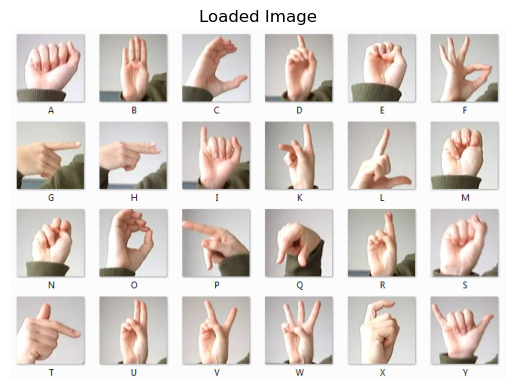

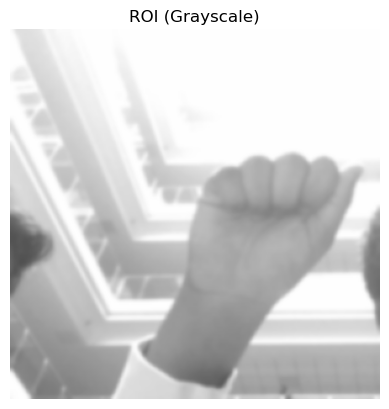

1/1 [==============================] - 0s 26ms/step


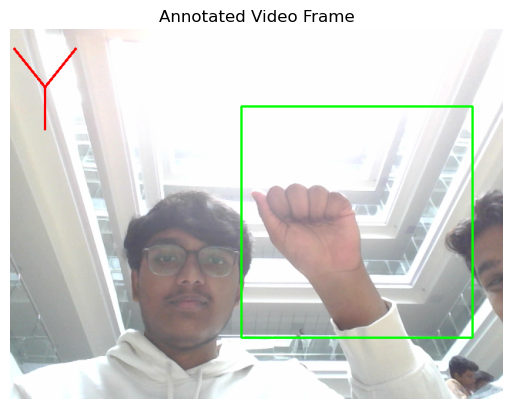

Press 'q' to quit or Enter to continue: 


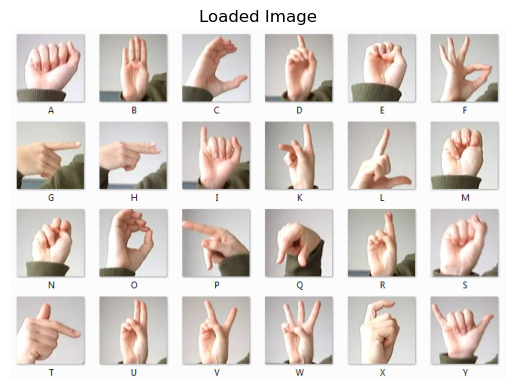

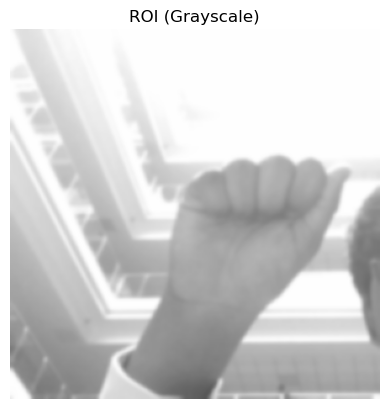

1/1 [==============================] - 0s 22ms/step


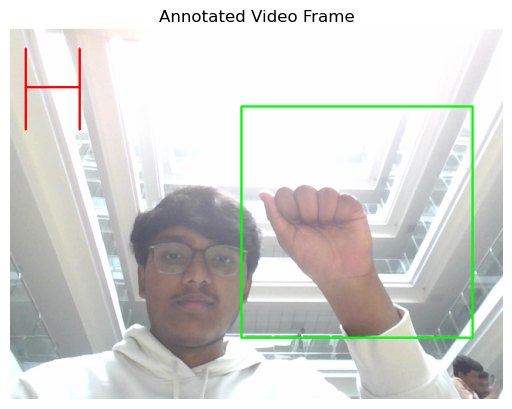

Press 'q' to quit or Enter to continue: 


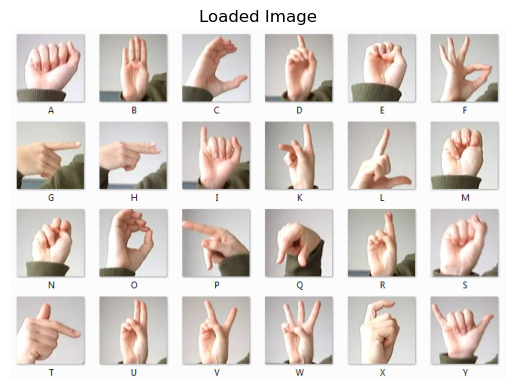

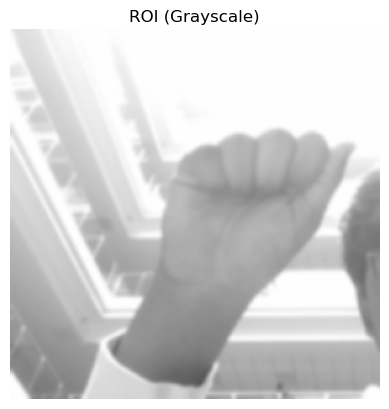

1/1 [==============================] - 0s 28ms/step


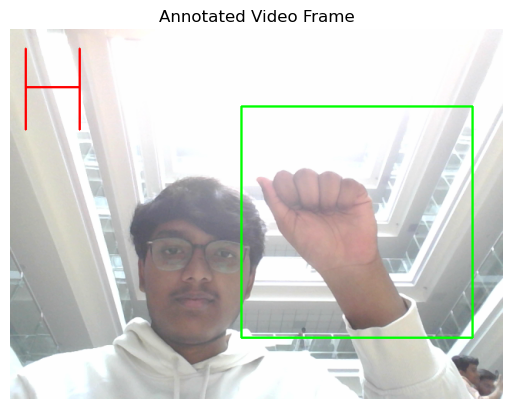

Press 'q' to quit or Enter to continue: 


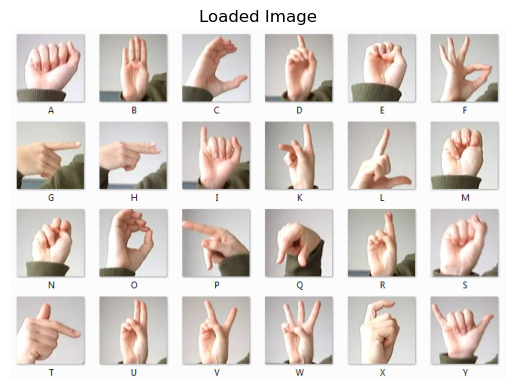

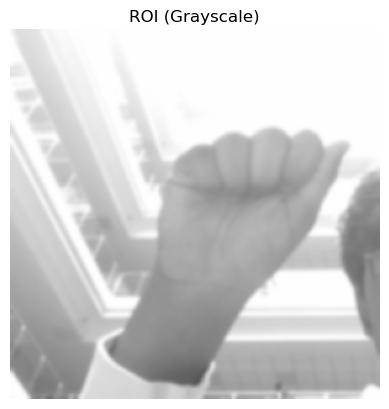

1/1 [==============================] - 0s 23ms/step


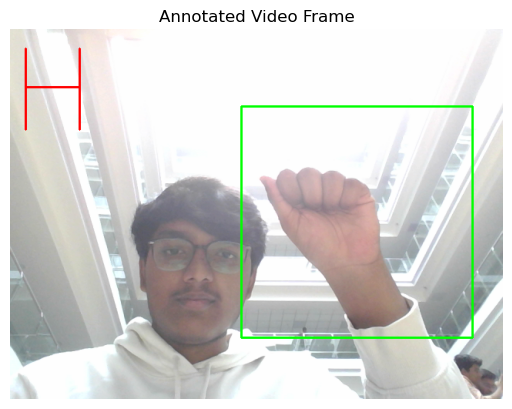

Press 'q' to quit or Enter to continue: 


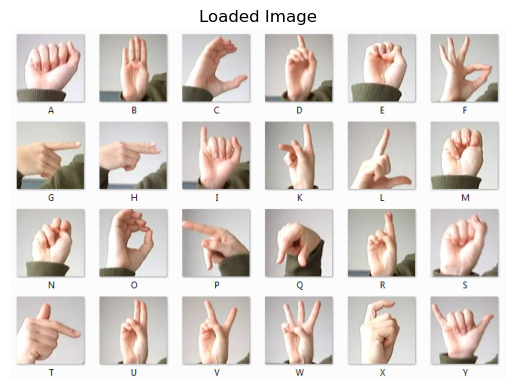

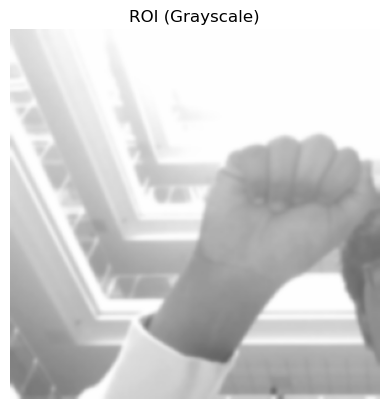

1/1 [==============================] - 0s 26ms/step


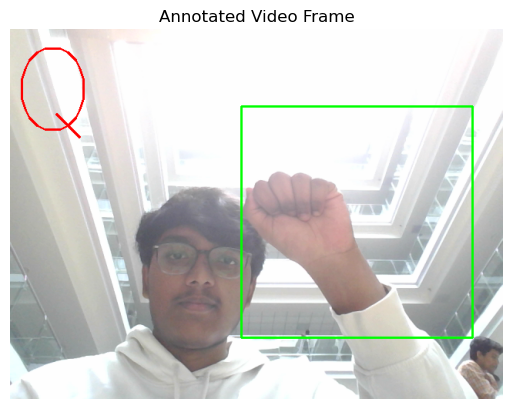

Press 'q' to quit or Enter to continue: 


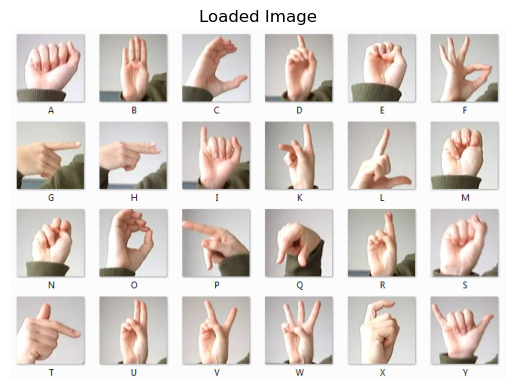

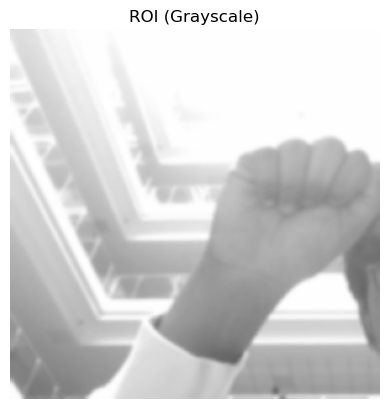

1/1 [==============================] - 0s 26ms/step


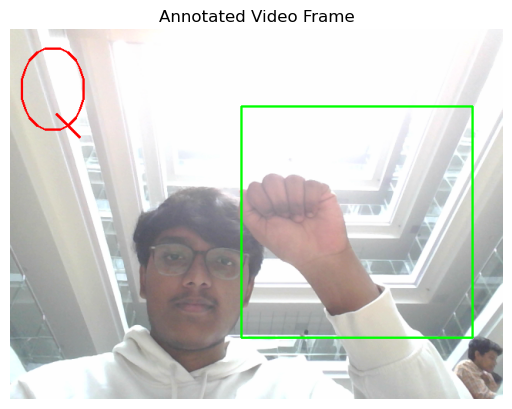

Press 'q' to quit or Enter to continue: 


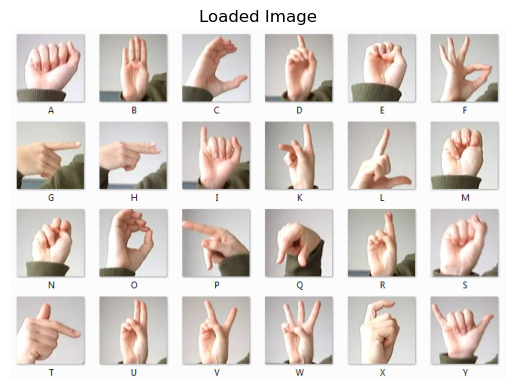

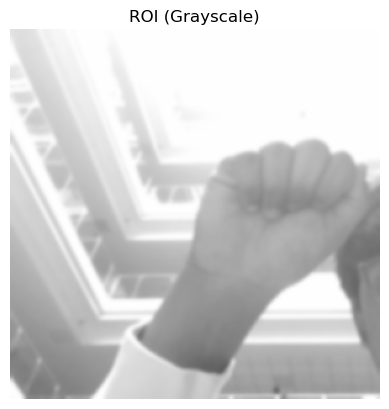

1/1 [==============================] - 0s 31ms/step


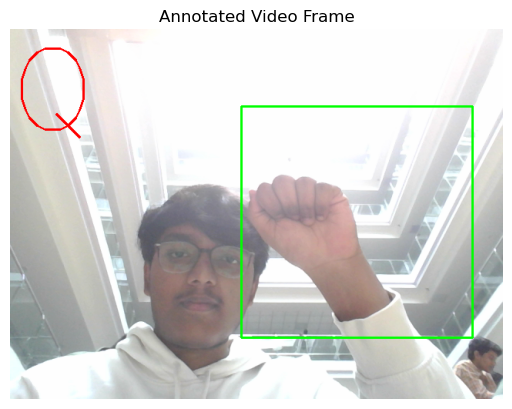

Press 'q' to quit or Enter to continue: 


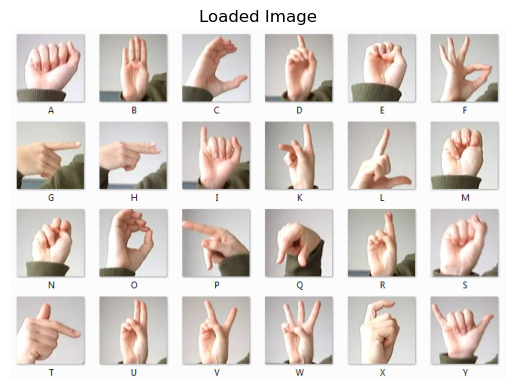

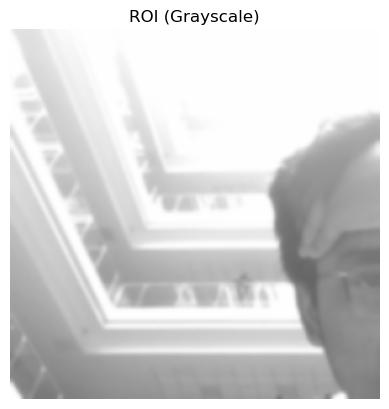

1/1 [==============================] - 0s 41ms/step


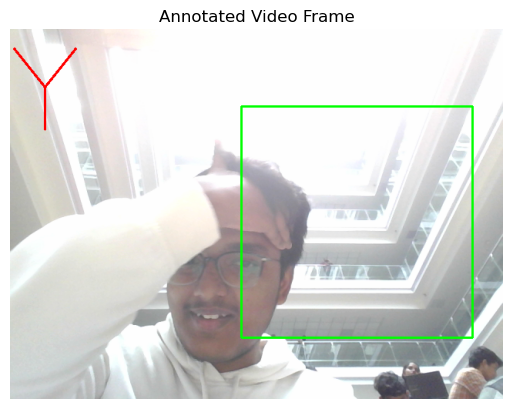

Press 'q' to quit or Enter to continue: 


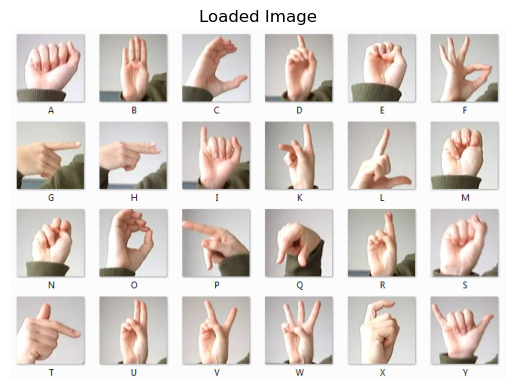

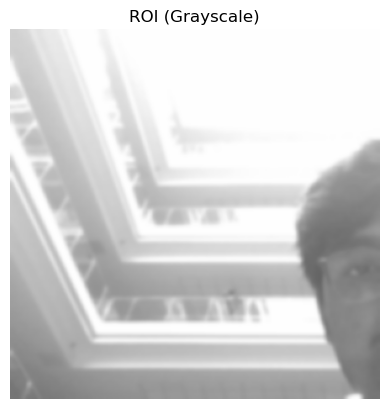

1/1 [==============================] - 0s 32ms/step


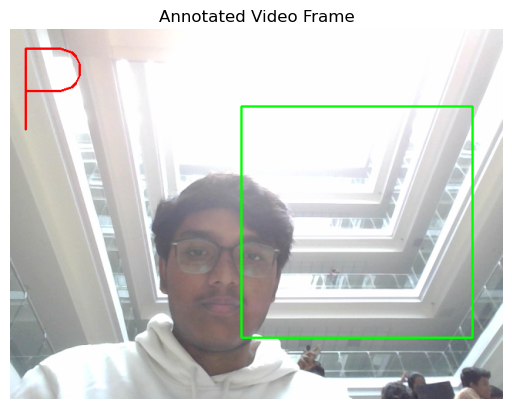

Press 'q' to quit or Enter to continue: 


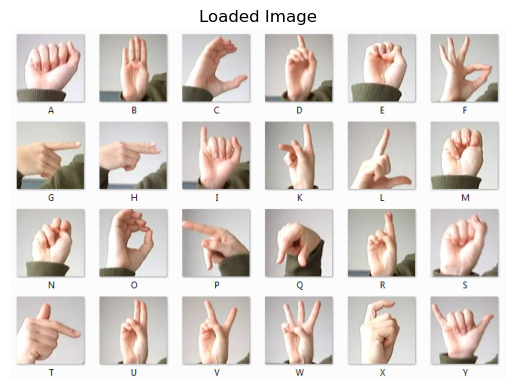

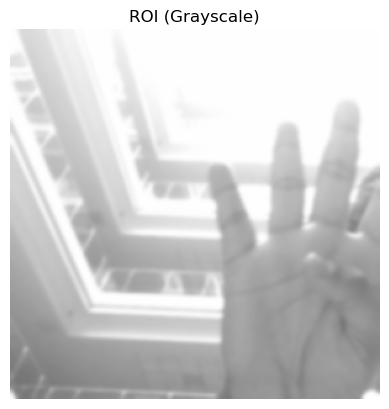

1/1 [==============================] - 0s 27ms/step


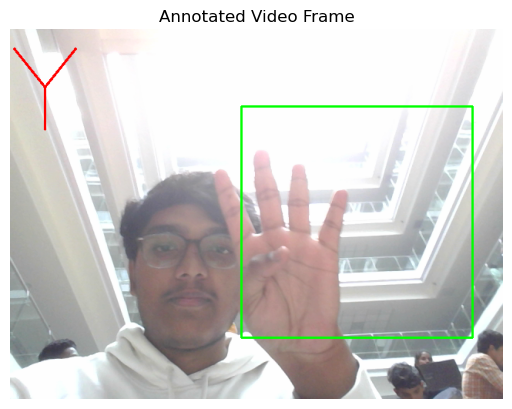

Press 'q' to quit or Enter to continue: 


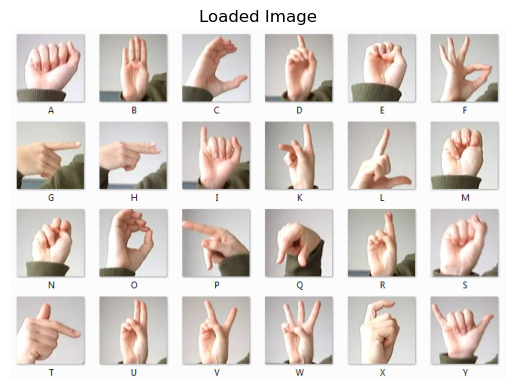

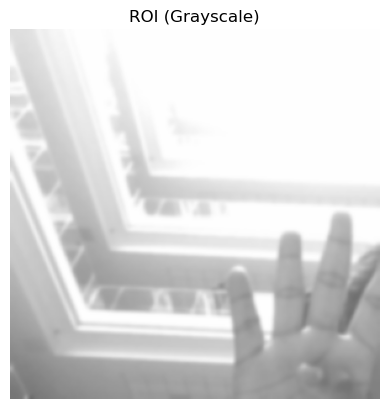

1/1 [==============================] - 0s 29ms/step


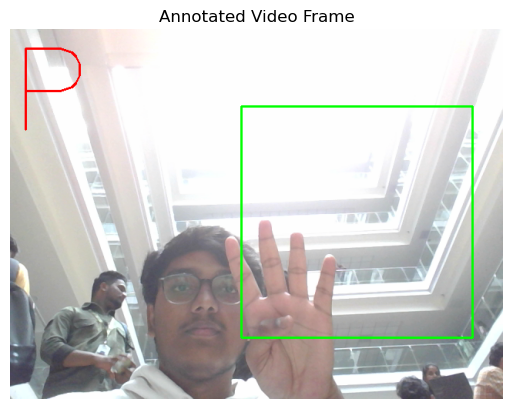

Press 'q' to quit or Enter to continue: 


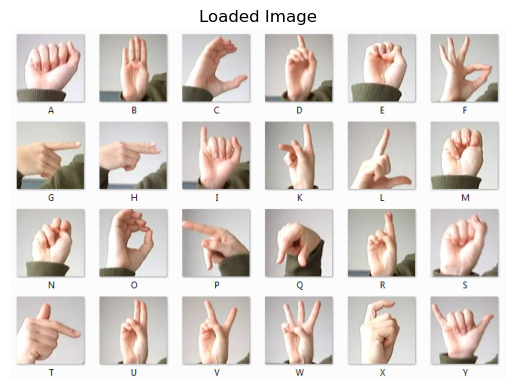

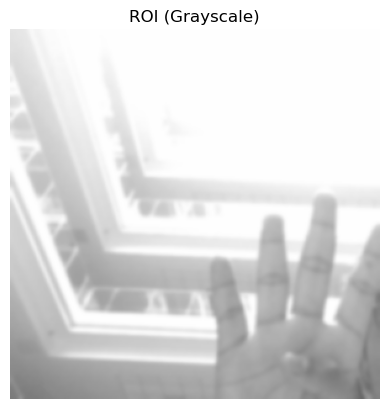

1/1 [==============================] - 0s 29ms/step


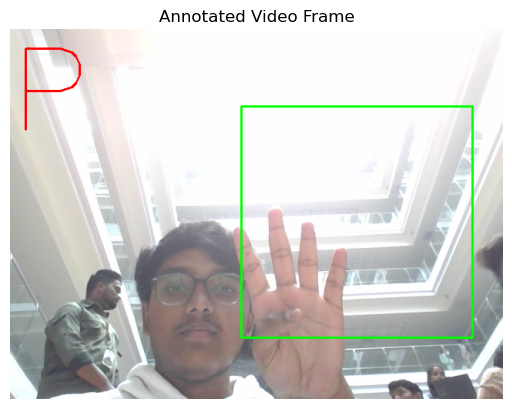

Press 'q' to quit or Enter to continue: 


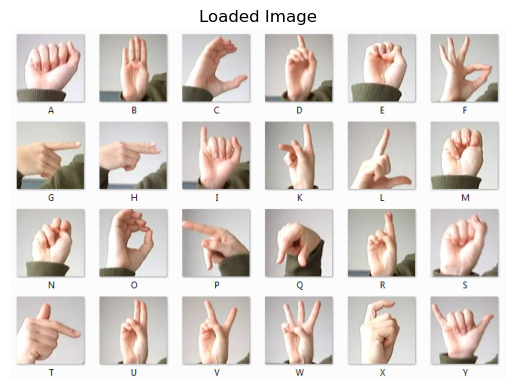

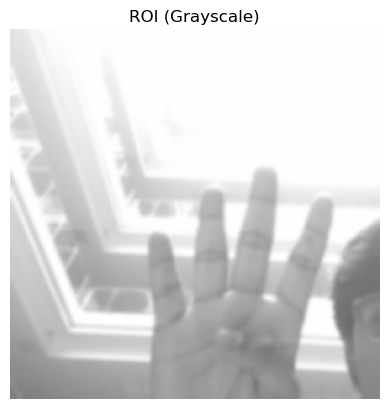

1/1 [==============================] - 0s 29ms/step


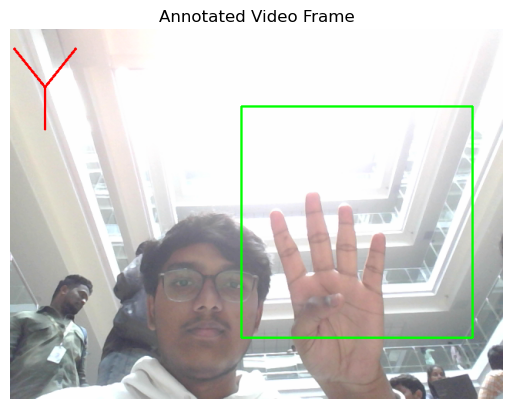

Press 'q' to quit or Enter to continue: 


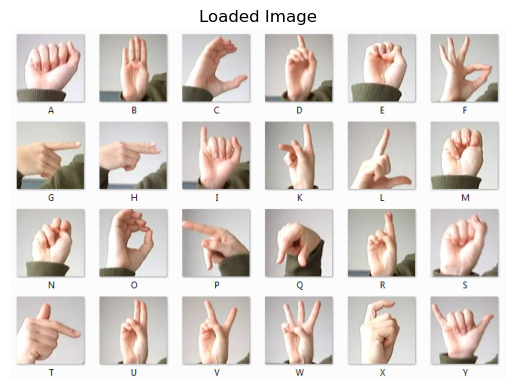

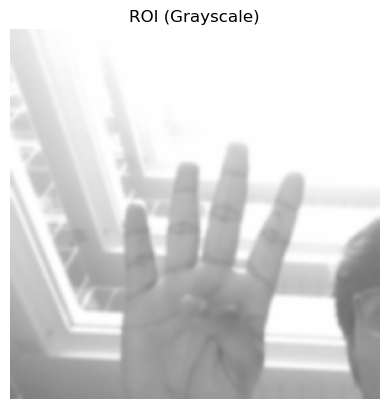

1/1 [==============================] - 0s 30ms/step


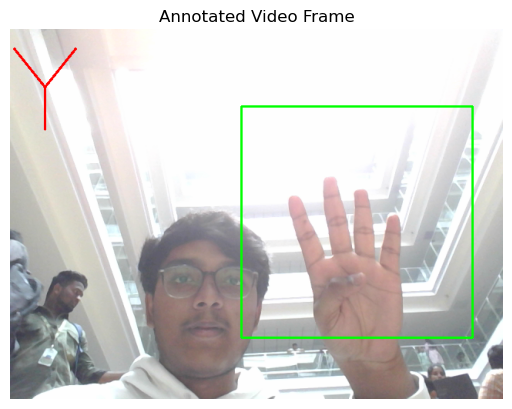

Press 'q' to quit or Enter to continue: 


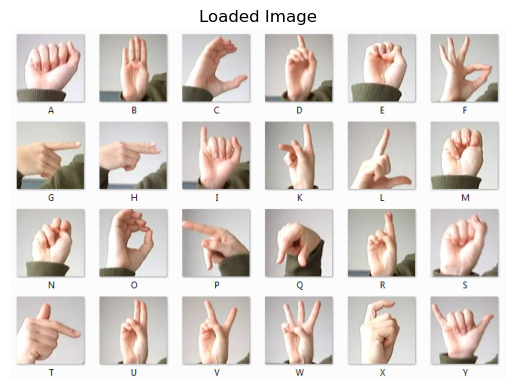

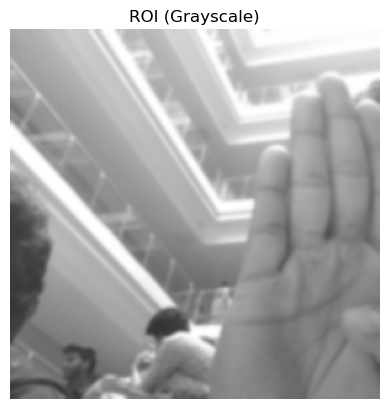

1/1 [==============================] - 0s 22ms/step


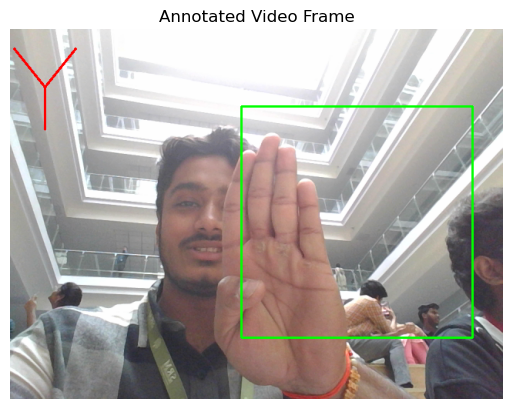

Press 'q' to quit or Enter to continue: 


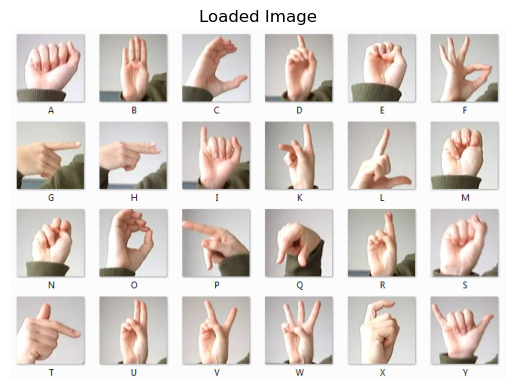

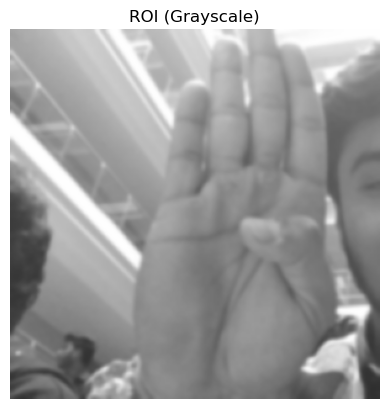

1/1 [==============================] - 0s 22ms/step


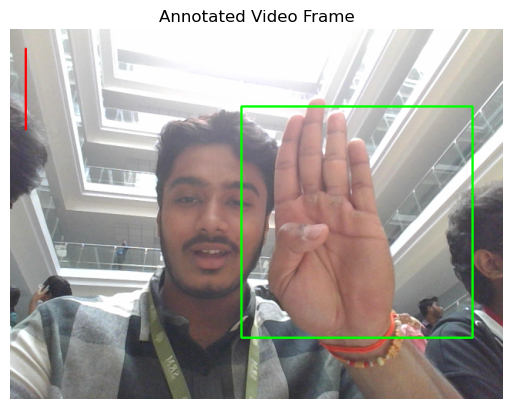

Press 'q' to quit or Enter to continue: 


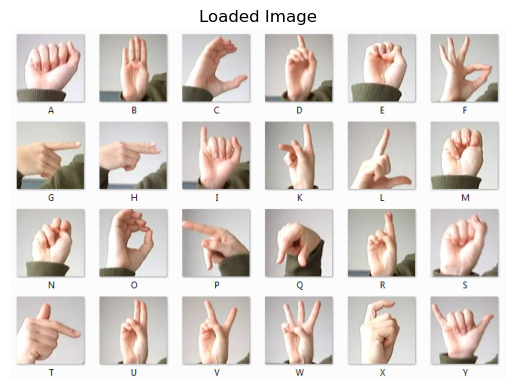

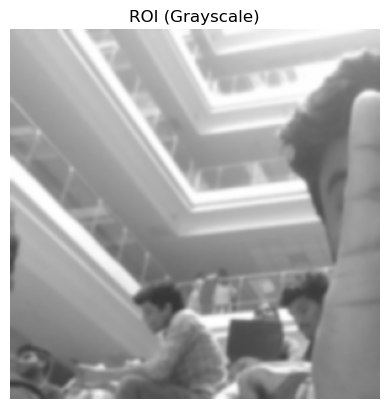

1/1 [==============================] - 0s 26ms/step


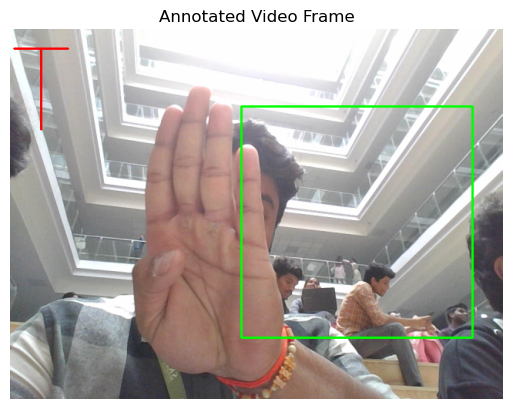

Press 'q' to quit or Enter to continue: 


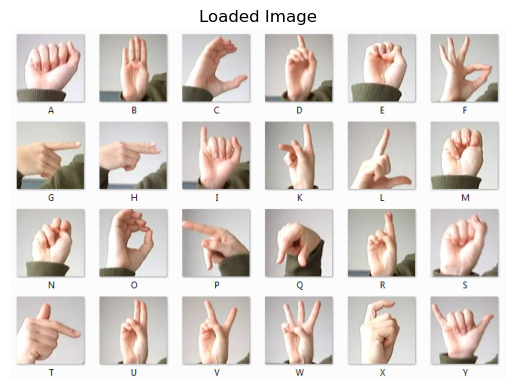

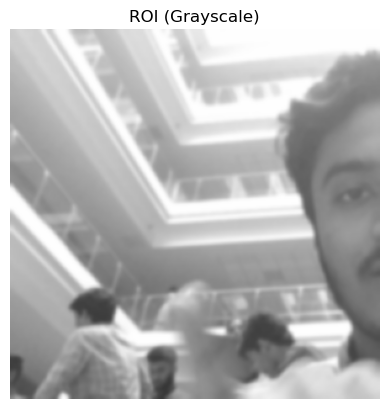

1/1 [==============================] - 0s 23ms/step


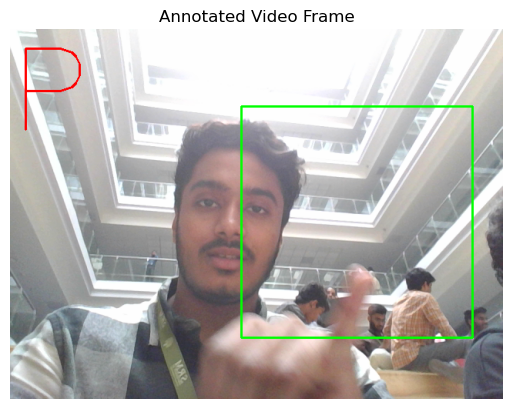

Press 'q' to quit or Enter to continue: 


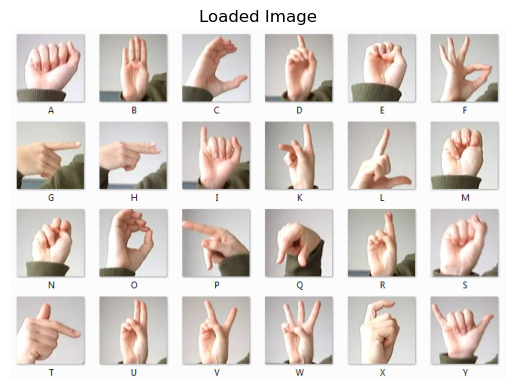

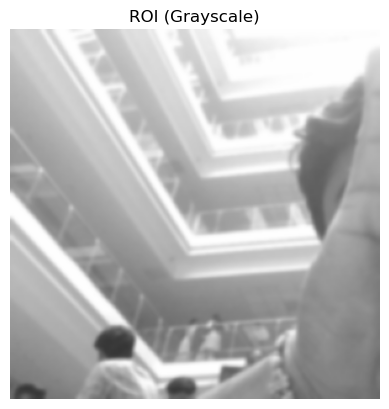

1/1 [==============================] - 0s 24ms/step


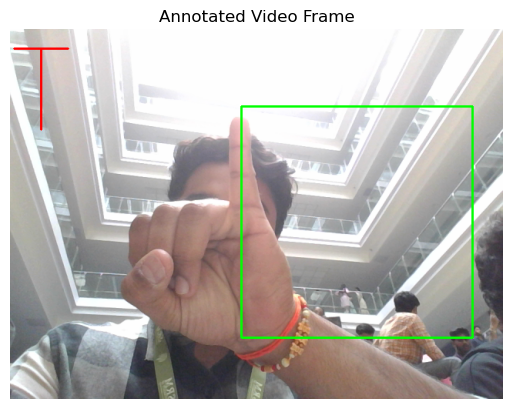

Press 'q' to quit or Enter to continue: 


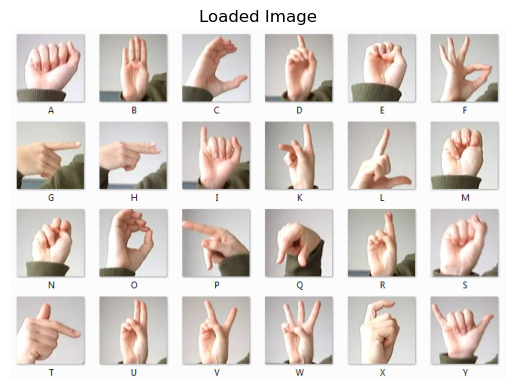

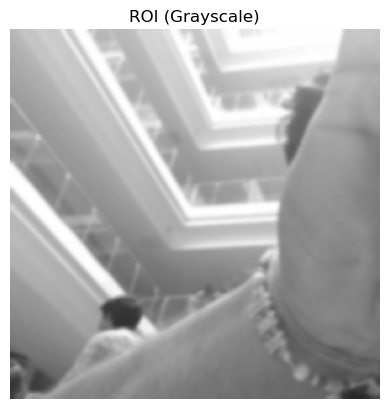

1/1 [==============================] - 0s 34ms/step


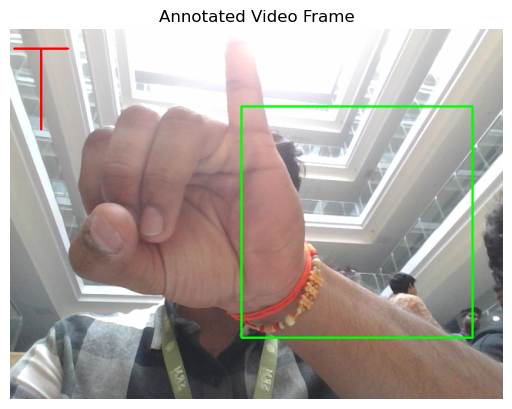

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Function to display an image using Matplotlib in Jupyter
def display_image(img, title="Image"):
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for proper display
    plt.title(title)
    plt.axis("off")
    plt.show()

cap = cv2.VideoCapture(0)  # Try using 0 or 1 for camera IDs

# Check if the camera is successfully opened
if not cap.isOpened():
    print("Error: Could not open camera.")
    exit()

# Adjust these coordinates for a larger ROI (larger detection frame)
top, right, bottom, left = 100, 300, 400, 600  # Increased size for detection box

while True:
    ret, img = cap.read()
    if not ret:
        print("Failed to capture image from camera.")
        break

    # Load a static image (for testing purposes)
    image = cv2.imread("C:/Users/91868/Downloads/download (1).png")
    if image is None:
        print("Failed to load image.")
        break

    # Display the static image
    display_image(image, title="Loaded Image")

    # Flip and process the captured video frame
    img = cv2.flip(img, 1)

    # Increased detection frame size (adjusted region)
    roi = img[top:bottom, right:left]
    roi = cv2.flip(roi, 1)
    gray = cv2.cvtColor(roi, cv2.COLOR_BGR2GRAY)
    gray = cv2.GaussianBlur(gray, (7, 7), 0)

    # Display the ROI (Region of Interest)
    display_image(gray, title="ROI (Grayscale)")

    # Assuming classify function is defined
    alpha = classify(gray)  # Replace this with actual model classification

    # Draw rectangle and add label on the original frame
    cv2.rectangle(img, (left, top), (right, bottom), (0, 255, 0), 2)
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(img, alpha, (0, 130), font, 5, (0, 0, 255), 2)

    # Display the annotated video frame
    display_image(img, title="Annotated Video Frame")

    key = input("Press 'q' to quit or Enter to continue: ")
    if key.lower() == 'q':
        break

cap.release()
